<center><h1>Tang_Lin_HW4</h1></center>
<br>
<br>

Name: Tang Lin
<br>
Github Username: MeLinOrDoreen
<br>
USC ID: 9012859074

## 1. Time Series Classification Part 1: Feature Creation/Extraction (HW3 Rerun)

### (a) Obtain Data

Import packages

In [181]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

import os
import random
from scipy.stats import bootstrap
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold
import statsmodels.api as sm
from sklearn import preprocessing

from sklearn.naive_bayes import GaussianNB, MultinomialNB

from sklearn.feature_selection import RFECV, RFE
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
from imblearn.over_sampling import SMOTE

import sklearn.metrics as metrics
from sklearn.metrics import accuracy_score
# to surpress warnings
import warnings
warnings.filterwarnings("ignore")

from tqdm import tqdm
from IPython.display import Image


Get the AReM Data Set

In [3]:
# Define a function to help us load the data sets
# data_path = '../Data/AReM/'
# we have already download the AReM data set in our local environment

### (b) Splitting Data

In [7]:
## Define a function to import multiple data sets in to one dataframe
def load_data(folder_path, file_range, test = True):
    data = pd.DataFrame()
    file_names = sorted(os.listdir(folder_path)) # Get all the file names in one folder

    if test == True:
        file_names = file_names[0:file_range] # According to the setting, to get the first few data sets as test data sets
    else:
        file_names = file_names[file_range:] # Choose the rest few data sets as train data sets

    for i, file_name in enumerate(file_names):
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path, skiprows= 4)
        df = pd.DataFrame(df)
        data = pd.concat([data,df])
        data = pd.DataFrame(data)
        

    return data



In [12]:
# Test data set
test_data = load_data("../Data/AReM/bending1", 2, test = True)
test_data = pd.concat([test_data,load_data("../Data/AReM/bending2", 2, test = True )])
test_data = pd.concat([test_data,load_data("../Data/AReM/cycling", 3, test = True )])
test_data = pd.concat([test_data,load_data("../Data/AReM/lying", 3, test = True )])
test_data = pd.concat([test_data,load_data("../Data/AReM/sitting", 3, test = True )])
test_data = pd.concat([test_data,load_data("../Data/AReM/standing", 3, test = True )])
test_data = pd.concat([test_data,load_data("../Data/AReM/walking/", 3, test = True )])

test_data

,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0,39.25,0.43,22.75,0.43,33.75,1.30
1,250,39.25,0.43,23.00,0.00,33.00,0.00
2,500,39.25,0.43,23.25,0.43,33.00,0.00
3,750,39.50,0.50,23.00,0.71,33.00,0.00
4,1000,39.50,0.50,24.00,0.00,33.00,0.00
...,...,...,...,...,...,...,...
475,118750,36.50,2.87,18.50,2.29,16.00,2.16
476,119000,35.00,9.70,18.67,0.94,18.33,2.05
477,119250,28.25,4.82,16.00,3.27,22.00,5.66
478,119500,32.25,8.26,12.50,4.15,15.25,2.77


In [14]:
# train data set
train_data = load_data("../Data/AReM/bending1", 2, test = False)
train_data = pd.concat([train_data,load_data("../Data/AReM/bending2", 2, test = False )])
train_data = pd.concat([train_data,load_data("../Data/AReM/cycling", 3, test = False )])
train_data = pd.concat([train_data,load_data("../Data/AReM/lying", 3, test = False )])
train_data = pd.concat([train_data,load_data("../Data/AReM/sitting", 3, test = False )])
train_data = pd.concat([train_data,load_data("../Data/AReM/standing", 3, test = False )])
train_data = pd.concat([train_data,load_data("../Data/AReM/walking/", 3, test = False )])

train_data


,# Columns: time,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23
0,0,42.00,0.71,21.25,0.43,30.00,0.00
1,250,41.50,0.50,20.25,1.48,31.25,1.09
2,500,41.50,0.50,14.25,1.92,33.00,0.00
3,750,40.75,0.83,15.75,0.43,33.00,0.00
4,1000,40.00,0.71,20.00,2.74,32.75,0.43
...,...,...,...,...,...,...,...
475,118750,31.50,1.66,12.50,3.20,14.25,4.44
476,119000,27.33,1.25,11.33,0.94,20.00,4.00
477,119250,37.80,7.68,14.20,2.48,17.25,0.83
478,119500,33.75,1.30,15.75,5.21,16.50,2.69


In [15]:
# Check the shape of train data set and test data set
print("Shape of the test data:",test_data.shape)
print("Shape of the training data:",train_data.shape)


Shape of the test data: (9120, 7)
Shape of the training data: (33119, 7)


### (c) Feature Extraction

In [17]:
# Combine the train and test datasets 
full_data = pd.concat([test_data,train_data]).iloc[:, 1:] # only need the 6 time series columns
full_data["Instance"] = full_data.index

# Divide into difference instances
full_data = full_data.reset_index(drop = True)

for i in range(1, 89): # There should be 89 instances in training data
    full_data.loc[(i-1)*480 : i*480 - 1, "Instance"] = i

##### Check if instances have same number of rows: instance 88 has only 479 rows, but it won't cause troubles for our analysis
# for i in range(1, 88):
#     if (full_data["Instance"] == i).sum() != (full_data["Instance"] == i +1 ).sum():
#         print(f"Different Length: Instance {i} & Instance {i+1}")

# Get the summaried features
feature_summary = full_data.groupby("Instance").describe() 

# Rename the column names
feature_summary.columns = ['_'.join(col).strip() for col in feature_summary.columns.values] 

# Drop the features "counts"
feature_summary = feature_summary.drop(columns = feature_summary.filter(like='count').columns)

feature_summary

,avg_rss12_mean,avg_rss12_std,avg_rss12_min,avg_rss12_25%,avg_rss12_50%,avg_rss12_75%,avg_rss12_max,var_rss12_mean,var_rss12_std,var_rss12_min,...,avg_rss23_50%,avg_rss23_75%,avg_rss23_max,var_rss23_mean,var_rss23_std,var_rss23_min,var_rss23_25%,var_rss23_50%,var_rss23_75%,var_rss23_max
Instance,,,,,,,,,,,,,,,,,,,,,
1,40.624792,1.476967,37.25,39.2500,40.500,42.00,45.00,0.358604,0.322605,0.0,...,35.00,36.00,38.25,0.570583,0.582915,0.0,0.00,0.43,1.300,1.92
2,42.812812,1.435550,38.00,42.0000,42.500,43.67,45.67,0.372437,0.289158,0.0,...,33.00,34.50,38.50,0.571083,0.601010,0.0,0.00,0.43,1.300,3.11
3,24.562958,3.737514,12.75,23.1875,24.250,26.50,51.00,0.590833,0.837408,0.0,...,23.75,27.00,30.00,0.700188,0.693720,0.0,0.43,0.50,0.870,4.97
4,27.464604,3.583582,0.00,25.5000,28.000,30.00,42.75,0.449708,0.767197,0.0,...,18.00,20.75,33.00,1.122125,1.012342,0.0,0.47,0.83,1.300,6.76
5,37.177042,3.581301,24.25,34.5000,36.250,40.25,45.00,2.374208,1.601799,0.0,...,20.00,21.75,25.50,2.921729,1.852600,0.0,1.50,2.50,3.900,9.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,34.770104,4.745938,20.75,31.6700,35.290,38.25,46.25,4.231521,2.279355,0.0,...,16.29,18.33,25.50,3.290875,1.643302,0.0,2.05,3.27,4.305,9.39
85,34.921750,4.643832,21.50,32.0000,35.500,38.00,51.00,4.109062,2.333053,0.0,...,16.25,18.25,25.00,3.285792,1.698713,0.0,2.12,3.03,4.500,10.21
86,34.316375,4.969229,18.33,31.2500,34.750,38.00,47.67,4.415938,2.593868,0.0,...,16.00,18.00,24.00,3.262583,1.617908,0.0,2.05,2.98,4.320,8.01


## 2. Time Series Classification Part 2: Binary and Multiclass Classification

### (a) Binary Classification Using Logistic Regression

#### i. Plots

In [18]:
#### Use training data set to redo the feature extraction 
train_features = train_data.iloc[:, 1:] # ony need the 6 time series columns
train_features = train_features.reset_index(drop = True)

train_features["Instance"] = 0 * len(train_features)

# Add Instance label to each row
for i in range(1, math.ceil(len(train_data)/480 + 1)):
    
    if i < 69:
        train_features.loc[ 480*(i - 1): i*480 - 1, "Instance"] = i
    elif i == 69:
        train_features.loc[ 480*(i - 1): , "Instance"] = i

train_features.tail()

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Instance
33114,31.50,1.66,12.50,3.20,14.25,4.44,69
33115,27.33,1.25,11.33,0.94,20.00,4.00,69
33116,37.80,7.68,14.20,2.48,17.25,0.83,69
33117,33.75,1.30,15.75,5.21,16.50,2.69,69
33118,32.67,3.09,18.67,0.47,14.00,3.16,69


In [10]:
# Create a new column called bending to indicate if the values are from the bending data sets: from bending - 1, else 0
# There should be 9 instances from the bending data sets
# The first 9*480 rows are from bending data sets
train_features["Activity"] = "Others"
train_features.loc[0: 9*480 -1, "Activity"] = "Bending"

label_dictionary = {'Others': 0, 'Bending': 1}
train_features['Label'] = train_features['Activity'].map(label_dictionary)

train_feature_summary = train_features.groupby(["Instance", "Activity", "Label"]).describe()
train_feature_summary.columns = ['_'.join(col).strip() for col in train_feature_summary.columns.values]

train_feature_summary

,,,avg_rss12_count,avg_rss12_mean,avg_rss12_std,avg_rss12_min,avg_rss12_25%,avg_rss12_50%,avg_rss12_75%,avg_rss12_max,var_rss12_count,var_rss12_mean,...,avg_rss23_75%,avg_rss23_max,var_rss23_count,var_rss23_mean,var_rss23_std,var_rss23_min,var_rss23_25%,var_rss23_50%,var_rss23_75%,var_rss23_max
Instance,Activity,Label,,,,,,,,,,,,,,,,,,,,,
1,Bending,1,480.0,43.954500,1.558835,35.00,43.00,44.330,45.00,47.40,480.0,0.426250,...,36.50,38.50,480.0,0.493292,0.513506,0.0,0.00,0.43,0.940,1.79
2,Bending,1,480.0,42.179812,3.670666,33.00,39.15,43.500,45.00,47.75,480.0,0.696042,...,36.33,38.67,480.0,0.613521,0.524317,0.0,0.00,0.50,1.000,2.18
3,Bending,1,480.0,41.678063,2.243490,33.00,41.33,41.750,42.75,45.75,480.0,0.535979,...,31.25,37.50,480.0,0.383292,0.389164,0.0,0.00,0.43,0.500,1.79
4,Bending,1,480.0,43.454958,1.386098,37.00,42.50,43.250,45.00,48.00,480.0,0.378083,...,24.00,33.50,480.0,0.679646,0.622534,0.0,0.43,0.50,0.870,5.26
5,Bending,1,480.0,43.969125,1.618364,36.25,43.31,44.500,44.67,48.00,480.0,0.413125,...,23.75,30.75,480.0,0.555312,0.487826,0.0,0.00,0.49,0.830,2.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,Others,0,480.0,34.770104,4.745938,20.75,31.67,35.290,38.25,46.25,480.0,4.231521,...,18.33,25.50,480.0,3.290875,1.643302,0.0,2.05,3.27,4.305,9.39
66,Others,0,480.0,34.921750,4.643832,21.50,32.00,35.500,38.00,51.00,480.0,4.109062,...,18.25,25.00,480.0,3.285792,1.698713,0.0,2.12,3.03,4.500,10.21
67,Others,0,480.0,34.316375,4.969229,18.33,31.25,34.750,38.00,47.67,480.0,4.415938,...,18.00,24.00,480.0,3.262583,1.617908,0.0,2.05,2.98,4.320,8.01


From 1(c)iv, we select the min, mean, and max as our most important time-domain features

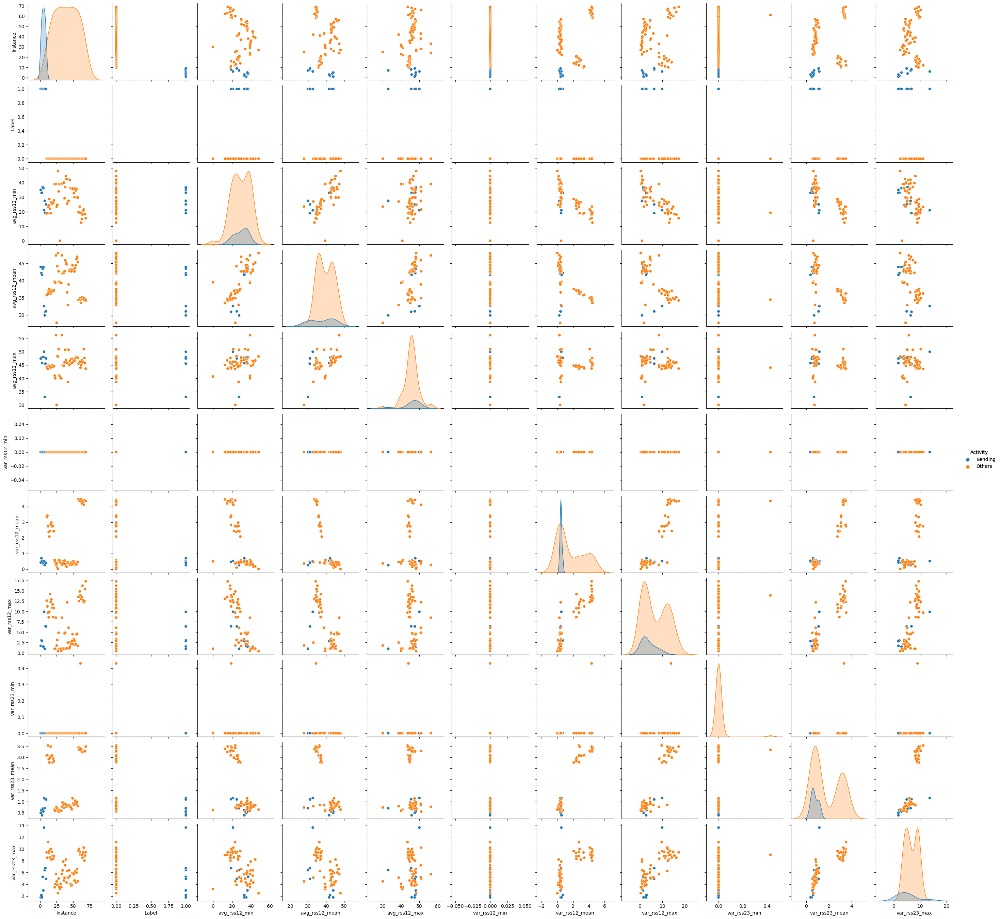

In [11]:
# Select the features from series 1, 2, 6 for pairplots
series_126 = train_feature_summary[["avg_rss12_min", "avg_rss12_mean", "avg_rss12_max", # Series 1
                                    "var_rss12_min", "var_rss12_mean", "var_rss12_max", # Series 2
                                    "var_rss23_min", "var_rss23_mean", "var_rss23_max"  # Series 6
                                    ]]

series_126 = series_126.reset_index()

graph_126 = sns.pairplot(series_126, hue="Activity")

graph_126.add_legend(title = "Activity")


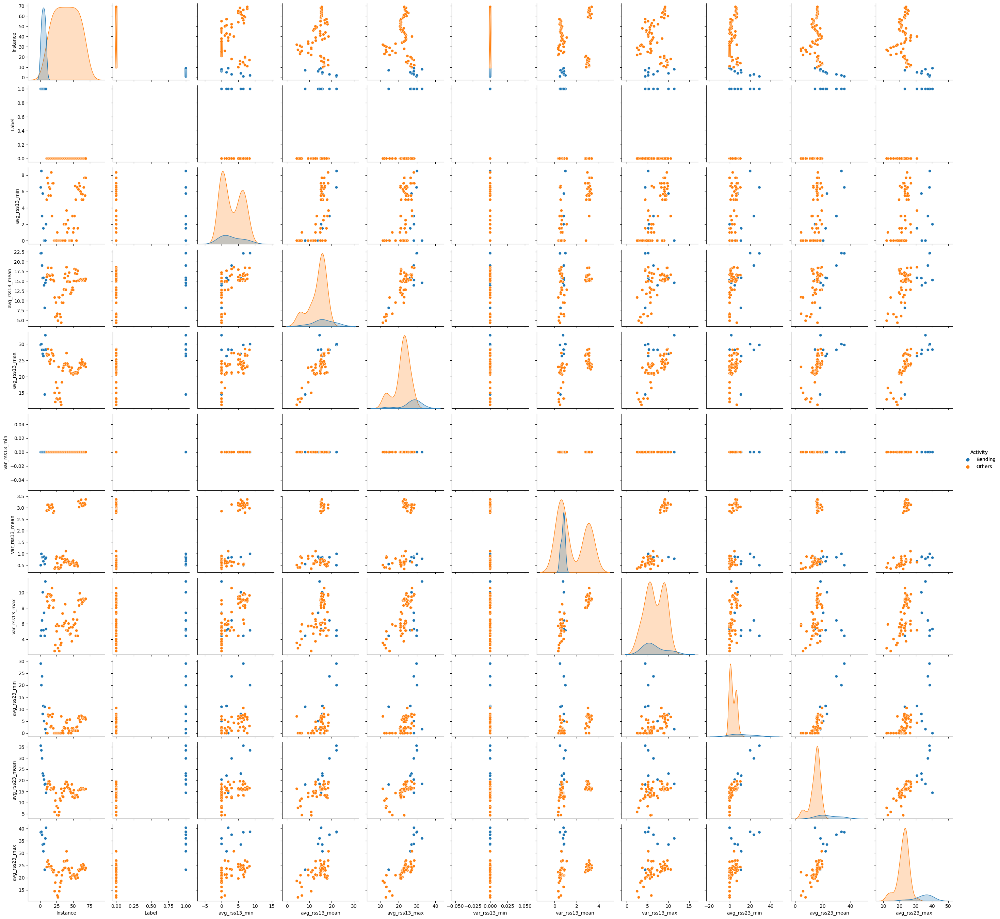

In [12]:
# Select the features from series 3, 4, 5 for pairplots
series_345 = train_feature_summary[["avg_rss13_min", "avg_rss13_mean", "avg_rss13_max", # Series 3
                                    "var_rss13_min", "var_rss13_mean", "var_rss13_max", # Series 4
                                    "avg_rss23_min", "avg_rss23_mean", "avg_rss23_max"  # Series 5
                                    ]]

series_345 = series_345.reset_index()

graph_345 = sns.pairplot(series_345, hue="Activity")

graph_345.add_legend(title = "Activity")

#### ii. Splitted Plots

In [14]:
##### Break the time series in training data 
# First half of the time series
break_data_1 = train_data[train_data.index <= 239]

break_data_1 = break_data_1.reset_index(drop= True) # Reset the formar index
break_data_1 = break_data_1.iloc[:, 1:]
break_data_1.columns = ["1_avg_rss12", "1_var_rss12", "1_avg_rss13", "1_var_rss13", "1_avg_rss23", "1_var_rss23"]


# # Second half of the time series
break_data_2 = train_data[train_data.index > 239]

break_data_2 = break_data_2.reset_index(drop= True) # Reset the formar index
break_data_2 = break_data_2.iloc[:, 1:]
break_data_2.columns = ["2_avg_rss12", "2_var_rss12", "2_avg_rss13", "2_var_rss13", "2_avg_rss23", "2_var_rss23"]

# Combine two time series to get a datd frame with 12 columns
train_data_broke = pd.concat([break_data_1, break_data_2], axis = 1)
train_data_broke = train_data_broke.dropna() # Drop the null value
train_data_broke

,1_avg_rss12,1_var_rss12,1_avg_rss13,1_var_rss13,1_avg_rss23,1_var_rss23,2_avg_rss12,2_var_rss12,2_avg_rss13,2_var_rss13,2_avg_rss23,2_var_rss23
0,42.00,0.71,21.25,0.43,30.00,0.00,43.33,0.94,18.00,0.00,35.67,0.47
1,41.50,0.50,20.25,1.48,31.25,1.09,44.20,0.75,19.75,0.83,35.40,1.20
2,41.50,0.50,14.25,1.92,33.00,0.00,45.00,0.00,21.75,0.83,35.00,1.41
3,40.75,0.83,15.75,0.43,33.00,0.00,45.00,0.00,23.33,0.47,36.00,0.00
4,40.00,0.71,20.00,2.74,32.75,0.43,45.00,0.00,24.00,0.00,36.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...
16554,32.75,2.68,19.50,5.59,16.25,2.05,31.50,1.66,12.50,3.20,14.25,4.44
16555,37.25,4.26,16.25,3.63,14.50,2.60,27.33,1.25,11.33,0.94,20.00,4.00
16556,24.25,3.27,12.25,1.79,13.50,5.59,37.80,7.68,14.20,2.48,17.25,0.83
16557,27.25,7.98,17.75,4.44,13.00,6.52,33.75,1.30,15.75,5.21,16.50,2.69


In [15]:
#### Get the time-domain features
# Add Instance label to each row
train_broke_features = train_data_broke
train_broke_features["Instance"] = 0

for i in range(1, math.ceil(len(train_data_broke)/240 + 1)):
    
    if i < 69:
        train_broke_features.loc[240*(i - 1): i*240 - 1, "Instance"] = i
    elif i == 69:
        train_broke_features.loc[240*(i - 1): , "Instance"] = i


# Create new columns called Bending and Label to indicate if the values are from the bending data sets: from bending 1, else 0
# There should be 9 instances from the bending data sets
# The first 9*240 rows are from bending data sets
train_broke_features["Activity"] = "Others"
train_broke_features.loc[0: 9*240 -1, "Activity"] = "Bending"

label_dictionary = {'Others': 0, 'Bending': 1}
train_broke_features['Label'] = train_broke_features['Activity'].map(label_dictionary)

train_broke_features_summary = train_broke_features.groupby(["Instance", "Activity", "Label"]).describe()
train_broke_features_summary.columns = ['_'.join(col).strip() for col in train_broke_features_summary.columns.values]

train_broke_features_summary.head(10)

,,,1_avg_rss12_count,1_avg_rss12_mean,1_avg_rss12_std,1_avg_rss12_min,1_avg_rss12_25%,1_avg_rss12_50%,1_avg_rss12_75%,1_avg_rss12_max,1_var_rss12_count,1_var_rss12_mean,...,2_avg_rss23_75%,2_avg_rss23_max,2_var_rss23_count,2_var_rss23_mean,2_var_rss23_std,2_var_rss23_min,2_var_rss23_25%,2_var_rss23_50%,2_var_rss23_75%,2_var_rss23_max
Instance,Activity,Label,,,,,,,,,,,,,,,,,,,,,
1,Bending,1,240.0,44.057167,1.556971,36.50,43.2500,44.500,45.0000,46.50,240.0,0.381042,...,36.2500,38.25,240.0,0.388333,0.478528,0.0,0.0000,0.00,0.71,1.50
2,Bending,1,240.0,43.278875,3.473355,33.75,42.0000,45.000,45.2500,47.75,240.0,0.673292,...,33.7500,38.50,240.0,0.586083,0.491873,0.0,0.0000,0.47,0.87,2.18
3,Bending,1,240.0,41.621208,3.118644,33.00,39.6525,42.330,44.2500,45.75,240.0,0.623083,...,30.5625,36.00,240.0,0.347500,0.363144,0.0,0.0000,0.43,0.50,1.50
4,Bending,1,240.0,44.117042,1.359836,39.00,43.5000,45.000,45.0000,48.00,240.0,0.250042,...,23.7500,26.00,240.0,0.543875,0.473445,0.0,0.4300,0.50,0.71,4.06
5,Bending,1,240.0,43.486208,1.281976,36.67,42.3300,43.710,44.5000,45.00,240.0,0.378667,...,23.5000,26.00,240.0,0.585750,0.487918,0.0,0.4225,0.50,0.83,2.96
6,Bending,1,240.0,32.014375,8.743464,21.00,24.7300,26.125,42.0000,50.00,240.0,0.587875,...,20.0000,24.00,240.0,0.786042,0.768408,0.0,0.4700,0.71,0.94,6.02
7,Bending,1,240.0,30.712417,0.937965,29.00,30.0000,30.290,31.5000,33.00,240.0,0.298958,...,19.2500,21.33,240.0,0.677917,0.322210,0.0,0.4700,0.71,0.94,1.50
8,Bending,1,240.0,29.189875,6.216895,19.00,25.9375,27.000,36.0000,39.25,240.0,0.497042,...,25.0000,36.00,240.0,1.114917,0.996452,0.0,0.4700,0.87,1.30,5.61
9,Bending,1,240.0,34.110625,5.097232,25.00,30.0000,30.500,39.3725,47.50,240.0,0.528500,...,13.7500,18.25,240.0,1.199958,0.838177,0.0,0.7100,1.00,1.41,4.92


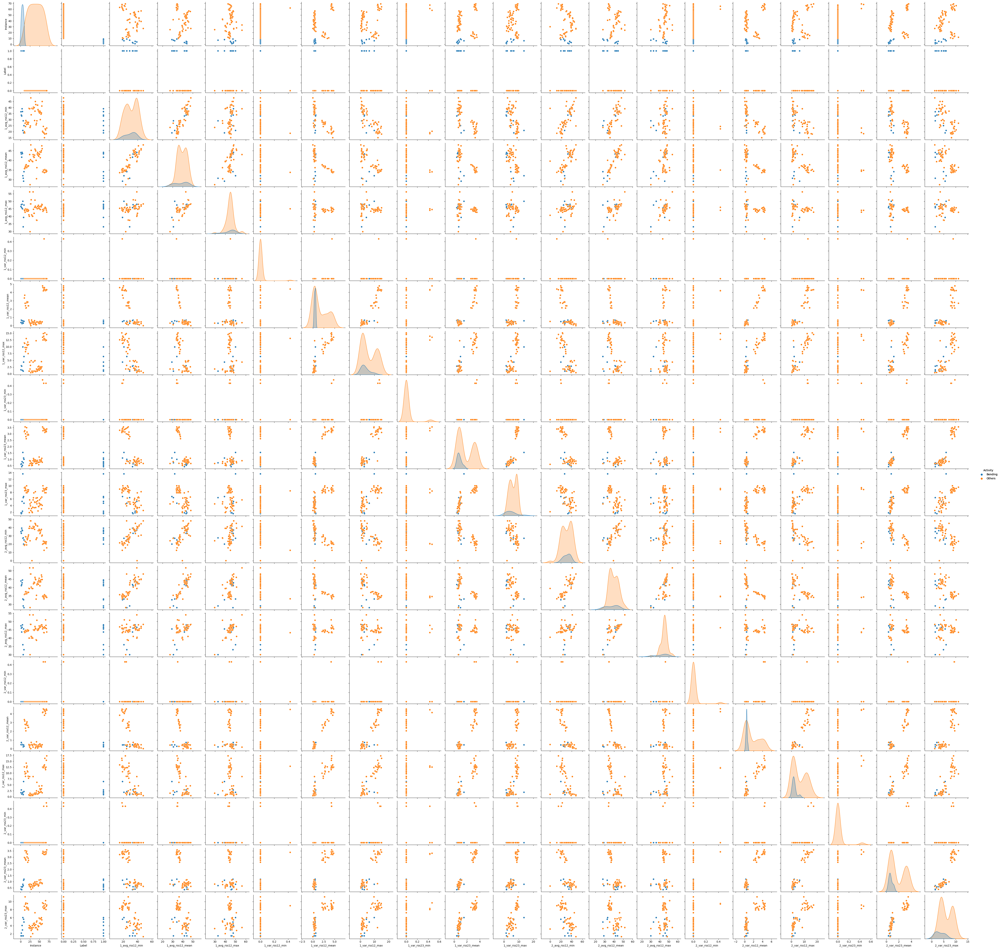

In [16]:
#### Choose the min, max, mean columns to make to pairplots
series_broke_126 = train_broke_features_summary[["1_avg_rss12_min", "1_avg_rss12_mean", "1_avg_rss12_max", # Series 1 part 1
                                                 "1_var_rss12_min", "1_var_rss12_mean", "1_var_rss12_max", # Series 2 part 1
                                                 "1_var_rss23_min", "1_var_rss23_mean", "1_var_rss23_max",  # Series 6 part 1
                                                 "2_avg_rss12_min", "2_avg_rss12_mean", "2_avg_rss12_max", # Series 1 part 2
                                                 "2_var_rss12_min", "2_var_rss12_mean", "2_var_rss12_max", # Series 2 part 2
                                                 "2_var_rss23_min", "2_var_rss23_mean", "2_var_rss23_max",  # Series 6 part 2
                                    ]]

series_broke_126 = series_broke_126.reset_index()

graph_broke_126 = sns.pairplot(series_broke_126, hue = "Activity")
graph_broke_126.add_legend(title="Activity")

#### iii. Time Series Segments

In [20]:
#### To get the initial all data set (with training data and test data)
initial_full_df = full_data
initial_full_df

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Instance
0,39.25,0.43,22.75,0.43,33.75,1.30,1
1,39.25,0.43,23.00,0.00,33.00,0.00,1
2,39.25,0.43,23.25,0.43,33.00,0.00,1
3,39.50,0.50,23.00,0.71,33.00,0.00,1
4,39.50,0.50,24.00,0.00,33.00,0.00,1
...,...,...,...,...,...,...,...
42234,31.50,1.66,12.50,3.20,14.25,4.44,88
42235,27.33,1.25,11.33,0.94,20.00,4.00,88
42236,37.80,7.68,14.20,2.48,17.25,0.83,88
42237,33.75,1.30,15.75,5.21,16.50,2.69,88


In [21]:
#### To get the initial test data set before splitting the time series

initial_test_df = test_data.iloc[:, 1:] # only need the 6 time series columns
initial_test_df["Instance"] = initial_test_df.index

# Divide into difference instances
initial_test_df = initial_test_df.reset_index(drop=True)

for i in range(1, 70): # There should be 69 instances in training data
    initial_test_df.loc[(i-1)*480 : i*480 - 1, "Instance"] = i

initial_test_df

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Instance
0,39.25,0.43,22.75,0.43,33.75,1.30,1
1,39.25,0.43,23.00,0.00,33.00,0.00,1
2,39.25,0.43,23.25,0.43,33.00,0.00,1
3,39.50,0.50,23.00,0.71,33.00,0.00,1
4,39.50,0.50,24.00,0.00,33.00,0.00,1
...,...,...,...,...,...,...,...
9115,36.50,2.87,18.50,2.29,16.00,2.16,19
9116,35.00,9.70,18.67,0.94,18.33,2.05,19
9117,28.25,4.82,16.00,3.27,22.00,5.66,19
9118,32.25,8.26,12.50,4.15,15.25,2.77,19


In [22]:
#### To get the initial training data set before splitting the time series

initial_train_df = train_data.iloc[:, 1:] # only need the 6 time series columns
initial_train_df["Instance"] = initial_train_df.index

# Divide into difference instances
initial_train_df = initial_train_df.reset_index(drop=True)

for i in range(1, 70): # There should be 69 instances in training data
    initial_train_df.loc[(i-1)*480 : i*480 - 1, "Instance"] = i

initial_train_df

,avg_rss12,var_rss12,avg_rss13,var_rss13,avg_rss23,var_rss23,Instance
0,42.00,0.71,21.25,0.43,30.00,0.00,1
1,41.50,0.50,20.25,1.48,31.25,1.09,1
2,41.50,0.50,14.25,1.92,33.00,0.00,1
3,40.75,0.83,15.75,0.43,33.00,0.00,1
4,40.00,0.71,20.00,2.74,32.75,0.43,1
...,...,...,...,...,...,...,...
33114,31.50,1.66,12.50,3.20,14.25,4.44,69
33115,27.33,1.25,11.33,0.94,20.00,4.00,69
33116,37.80,7.68,14.20,2.48,17.25,0.83,69
33117,33.75,1.30,15.75,5.21,16.50,2.69,69


In [166]:
#### Split time series
def splitted_df(l, df): # l is the number split
    chunck_size = 480 // l

    chunks = [df.iloc[i : i + chunck_size] for i in range(0, len(df), chunck_size)]

    # Create a column called Part to indicate which part it is from the original data set
    for i, chunk in enumerate(chunks):
        chunk["Part"] = i % l
        if i%l == 0:
            chunk["Part"] = l

    #### Get the 3 time-domain feature from the splitted data sets: min, mean, max
    chunk_all = [chunk.groupby(["Instance", "Part"]).agg(["min", "mean", "max"]) for chunk in chunks]
    chunk_all = pd.concat(chunk_all)

    # To get a wider dataframe for regression
    chunk_all = chunk_all.pivot_table(index='Instance', columns='Part', values=["avg_rss12", "var_rss12", "avg_rss13", "var_rss13", "avg_rss23", "var_rss23"], aggfunc='first')
    chunk_all.columns = [f'{col[0]}_{col[1]}_{col[2]}_{i}' for i, col in enumerate(chunk_all.columns)] # Column name: time series_min/mean/max_part_column number
    chunk_all["Label"] = np.where(chunk_all.reset_index()["Instance"] <= 9, 1, 0) # Create a label column
    return chunk_all

In [167]:
lp_score = dict()

for l in tqdm(range(1, 21)):
    train_df = splitted_df(l, initial_train_df)

    X_train = train_df.loc[:, train_df.columns != "Label"]
    y_train = train_df.loc[:, "Label"]

    # Feature selection
    selector = RFECV(estimator=LogisticRegression(), cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=45))

    # Fit the feature selector to your data
    selector.fit(X_train, y_train)

    # Transform the features to keep only the selected ones
    X_train_selected = selector.transform(X_train)
    p = len(X_train_selected) # From the recursive backward selection, the number of parameter we choose using Cross Validation

    # Fit the model by using parameter selected by CV
    model = LogisticRegression(solver='liblinear')

    # Fit the model on the selected features
    model.fit(X_train_selected, y_train)

    # Predict using the selected features
    y_pred = model.predict(X_train_selected)

    # Evaluate the accuracy of the model using accuracy score
    accuracy = accuracy_score(y_train, y_pred)

    lp_score[f"{l}_{p}"] = accuracy

100%|██████████| 20/20 [05:32<00:00, 16.65s/it]


In [180]:
log_lp_score = pd.DataFrame(list(lp_score.items()), columns= ["Pair", "Accuracy"])
#Gau_pairs_with_accuracy = pd.DataFrame(list(Gau_l_score.items()), columns=['Pair', 'Accuracy'])
log_lp_score.max()

Pair        9_69
Accuracy     1.0
dtype: object

The best pair is: (l,p) = (9, 69), with CV accuracy score: 1.
This indicate the overfitting.

For performing Cross Validation:
<br>
- Right way: use the training data set to do the CV because the test data set is small compare to the training data set
- Wrong way: use the test data to do the CV, or to do multiple CVs.


#### iv. Confusion Matrix

In [182]:
# Get the train data to refit the model 
refit_train_df = splitted_df(9, initial_train_df)

X_refit_train = refit_train_df.loc[:, refit_train_df.columns != "Label"]
y_refit_train = refit_train_df.loc[:, "Label"]

In [183]:
# Use RFE to get the selected columns
rfe = RFE(LogisticRegression(), n_features_to_select= 69)
rfe = rfe.fit(X_refit_train, y_refit_train)

In [184]:
# Selected columns in X_refit_train
X_train_selected = X_refit_train[X_refit_train.columns[rfe.support_]]

In [200]:
# Use statsmodel.Logit to calculate the coefficients and p-values
X_train_selected_1 = sm.add_constant(X_train_selected)
logit_model = sm.Logit(y_refit_train, X_train_selected_1)
logit_result = logit_model.fit()
logit_result.summary()

         Current function value: 0.001846
         Iterations: 35


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Label   No. Observations:                   69
Model:                          Logit   Df Residuals:                        0
Method:                           MLE   Df Model:                           68
Date:                Mon, 16 Oct 2023   Pseudo R-squ.:                  0.9952
Time:                        22:42:58   Log-Likelihood:               -0.12737
converged:                      False   LL-Null:                       -26.718
Covariance Type:            nonrobust   LLR p-value:                    0.9064
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    3.9851   7.39e+07   5.39e-08      1.000   -1.45e+08    1.45e+08
avg_rss12_max_1_0       -4.3860   2.49e+06  -1.76e-06      1.000   -4.88e+06    4.88e+06
avg_rss12_max_2_1        5.1934        nan        nan        nan         nan         nan
avg_rss12_max_4_3       -2.0718   1.43e+06  -1.45e-06      1.000    -2.8e+06     2.8e+06
avg_rss12_max_6_5       -1.4285        nan        nan        nan         nan         nan
avg_rss12_max_7_6       -1.4783   1.78e+06  -8.32e-07      1.000   -3.48e+06    3.48e+06
avg_rss12_max_8_7        3.9981   2.73e+06   1.46e-06      1.000   -5.36e+06    5.36e+06
avg_rss12_max_9_8        1.3791   2.61e+06   5.28e-07      1.000   -5.12e+06    5.12e+06
avg_rss12_mean_1_9       0.5541        nan        nan        nan         nan         nan
avg_rss12_mean_2_10     -9.1703    2.2e+06  -4.17e-06      1.000   -4.31e+06    4.31e+06
avg_rss12_mean_4_12      7.5622   2.57e+06   2.94e-06      1.000   -5.04e+06    5.04e+06
avg_rss12_mean_7_15     -6.4398   4.64e+06  -1.39e-06      1.000    -9.1e+06     9.1e+06
avg_rss12_mean_9_17      1.4707   2.53e+06   5.82e-07      1.000   -4.95e+06    4.95e+06
avg_rss12_min_2_19       5.6832   2.37e+06    2.4e-06      1.000   -4.64e+06    4.64e+06
avg_rss12_min_4_21      -2.2696   7.36e+05  -3.08e-06      1.000   -1.44e+06    1.44e+06
avg_rss12_min_6_23      -1.3223   1.99e+06  -6.63e-07      1.000   -3.91e+06    3.91e+06
avg_rss12_min_7_24       2.7787   3.05e+06    9.1e-07      1.000   -5.98e+06    5.98e+06
avg_rss12_min_8_25      -1.4637   1.57e+06  -9.32e-07      1.000   -3.08e+06    3.08e+06
avg_rss13_max_1_27       0.3063   4.85e+06   6.32e-08      1.000    -9.5e+06     9.5e+06
avg_rss13_max_2_28       1.0670   4.14e+06   2.58e-07      1.000   -8.11e+06    8.11e+06
avg_rss13_max_3_29       0.3664   2.96e+06   1.24e-07      1.000   -5.81e+06    5.81e+06
avg_rss13_max_9_35      -1.1308   2.02e+06  -5.59e-07      1.000   -3.96e+06    3.96e+06
avg_rss13_mean_5_40     -0.5957        nan        nan        nan         nan         nan
avg_rss13_mean_6_41      0.8862    5.2e+06    1.7e-07      1.000   -1.02e+07    1.02e+07
avg_rss13_min_1_45       2.3145        nan        nan        nan         nan         nan
avg_rss13_min_2_46      -1.5417    1.9e+06  -8.13e-07      1.000   -3.71e+06    3.71e+06
avg_rss13_min_3_47       0.4420        nan        nan        nan         nan         nan
avg_rss13_min_6_50       1.2079   4.46e+06   2.71e-07      1.000   -8.74e+06    8.74e+06
avg_rss13_min_8_52       1.2910   5.93e+06   2.18e-07      1.000   -1.16e+07    1.16e+07
avg_rss13_min_9_53      -1.0531   3.95e+06  -2.67e-07      1.000   -7.74e+06    7.74e+06
avg_rss23_max_1_54      -5.8608   7.26e+06  -8.07e-07      1.000   -1.42e+07    1.42e+07
avg_rss23_max_2_55       2.3186        nan        nan        nan         nan         nan
avg_rss23_max_3_56       1.2596   2.75e+06   4.58e-07      1.000   -5.39e+06    5.39e+06
avg_rss23_max_7_60      -1.7119   4.2

In [188]:
# Make predictions
yhat = logit_result.predict(X_train_selected) 
prediction = list(map(round, yhat))

In [189]:
# Confusion matrix
confusion = confusion_matrix(y_refit_train, prediction) # confusion martrix
confusion

array([[60,  0],
       [ 0,  9]])

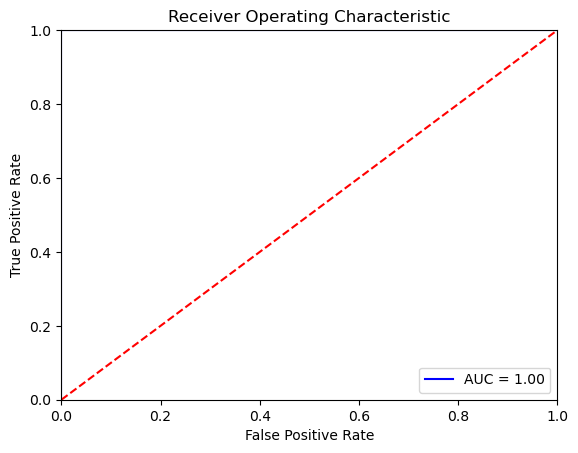

In [190]:
# ROC, AUC curve
fpr, tpr, threshold = metrics.roc_curve(y_refit_train, prediction)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

#### v. Test Classifier

In [191]:
# Get the test data to refit the model 
refit_test_df = splitted_df(9, initial_test_df)

X_refit_test = refit_test_df.loc[:, refit_test_df.columns != "Label"]
y_refit_test = refit_test_df.loc[:, "Label"]

In [192]:
# Refit the model 
# Selected columns in X_refit_test
X_test_selected = X_refit_test[X_refit_test.columns[rfe.support_]]

In [193]:
# Use statsmodel.Logit to calculate the coefficients and p-values
X_test_selected = sm.add_constant(X_test_selected)
logit_model = sm.Logit(y_refit_test, X_test_selected)
logit_result = logit_model.fit()
logit_result.summary()

         Current function value: 0.000031
         Iterations: 35


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Label   No. Observations:                   19
Model:                          Logit   Df Residuals:                        0
Method:                           MLE   Df Model:                           18
Date:                Mon, 16 Oct 2023   Pseudo R-squ.:                   1.000
Time:                        22:39:57   Log-Likelihood:            -0.00058653
converged:                      False   LL-Null:                       -13.143
Covariance Type:            nonrobust   LLR p-value:                   0.09340
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    0.0626   1.82e+09   3.43e-11      1.000   -3.57e+09    3.57e+09
avg_rss12_max_1_0       -0.7040        nan        nan        nan         nan         nan
avg_rss12_max_2_1       -0.0592        nan        nan        nan         nan         nan
avg_rss12_max_4_3       -0.2070        nan        nan        nan         nan         nan
avg_rss12_max_6_5       -0.3952        nan        nan        nan         nan         nan
avg_rss12_max_7_6       -0.3858   5.82e+07  -6.62e-09      1.000   -1.14e+08    1.14e+08
avg_rss12_max_8_7        0.3464   1.43e+08   2.42e-09      1.000   -2.81e+08    2.81e+08
avg_rss12_max_9_8        1.8778        nan        nan        nan         nan         nan
avg_rss12_mean_1_9      -1.3972        nan        nan        nan         nan         nan
avg_rss12_mean_2_10     -0.8349        nan        nan        nan         nan         nan
avg_rss12_mean_4_12     -1.1379   5.43e+07   -2.1e-08      1.000   -1.06e+08    1.06e+08
avg_rss12_mean_7_15     -0.2864        nan        nan        nan         nan         nan
avg_rss12_mean_9_17      0.2645      8e+06   3.31e-08      1.000   -1.57e+07    1.57e+07
avg_rss12_min_2_19       0.5172        nan        nan        nan         nan         nan
avg_rss12_min_4_21      -0.6706   2.99e+07  -2.24e-08      1.000   -5.86e+07    5.86e+07
avg_rss12_min_6_23       0.0491        nan        nan        nan         nan         nan
avg_rss12_min_7_24       0.5894        nan        nan        nan         nan         nan
avg_rss12_min_8_25       0.3578        nan        nan        nan         nan         nan
avg_rss13_max_1_27       0.5555        nan        nan        nan         nan         nan
avg_rss13_max_2_28       1.6048        nan        nan        nan         nan         nan
avg_rss13_max_3_29       1.4444   6.59e+07   2.19e-08      1.000   -1.29e+08    1.29e+08
avg_rss13_max_9_35       1.7084        nan        nan        nan         nan         nan
avg_rss13_mean_5_40     -0.9873   8.68e+07  -1.14e-08      1.000    -1.7e+08     1.7e+08
avg_rss13_mean_6_41     -1.5539   7.75e+07     -2e-08      1.000   -1.52e+08    1.52e+08
avg_rss13_min_1_45       0.1311        nan        nan        nan         nan         nan
avg_rss13_min_2_46      -1.9841        nan        nan        nan         nan         nan
avg_rss13_min_3_47      -1.0630        nan        nan        nan         nan         nan
avg_rss13_min_6_50      -1.0395   4.46e+07  -2.33e-08      1.000   -8.75e+07    8.75e+07
avg_rss13_min_8_52       0.5710    1.1e+08   5.18e-09      1.000   -2.16e+08    2.16e+08
avg_rss13_min_9_53      -2.7888   1.78e+08  -1.57e-08      1.000   -3.49e+08    3.49e+08
avg_rss23_max_1_54      -0.3271        nan        nan        nan         nan         nan
avg_rss23_max_2_55      -0.9802        nan        nan        nan         nan         nan
avg_rss23_max_3_56       1.6357   6.58e+07   2.49e-08      1.000   -1.29e+08    1.29e+08
avg_rss23_max_7_60      -1.0972   3.9

In [194]:
# Make predictions
yhat = logit_result.predict(X_test_selected) 
prediction_test = list(map(round, yhat))

In [195]:
# Get the accuracy from the test data
confusion_test = confusion_matrix(y_refit_test, prediction_test)
confusion_test

array([[10,  0],
       [ 0,  9]])

In [196]:
# Get the accuracy score 
accuracy_score_test = (confusion_test[0][0] + confusion_test[1][1])/ confusion_test.sum()
accuracy_score_test

1.0

#### vi. Separation

Yes, there are too many features and less observations when we sperate the time series into smaller pieces. And there also exist quasi seperation.

#### vii. Imbalance

Yes, the data is imbalanced. We have lots of data point belongs to other activities and few data points belongs to bending. 

In [225]:
# Case control sampling: under-sampling the majority class (controls) and/or over-sampling the minority class (cases)
# SMOTE
sampling = SMOTE()
X_train_selected = X_refit_train[X_refit_train.columns[rfe.support_]]
X_res_train, y_res_train = sampling.fit_resample(X_refit_train, y_refit_train)

In [226]:
# refit the model using resampled data
X_res_train_1 = sm.add_constant(X_res_train)
log_model_res = sm.Logit(y_res_train, X_res_train_1, method='bfgs')
logit_res_result = log_model_res.fit()
logit_res_result.summary()

         Current function value: 0.000183
         Iterations: 35


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                  Label   No. Observations:                  120
Model:                          Logit   Df Residuals:                       51
Method:                           MLE   Df Model:                           68
Date:                Mon, 16 Oct 2023   Pseudo R-squ.:                  0.9997
Time:                        22:52:28   Log-Likelihood:              -0.021937
converged:                      False   LL-Null:                       -83.178
Covariance Type:            nonrobust   LLR p-value:                 3.296e-10
========================================================================================
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   -0.0622   8.49e+07  -7.32e-10      1.000   -1.66e+08    1.66e+08
avg_rss12_max_1_0       -0.8586        nan        nan        nan         nan         nan
avg_rss12_max_2_1        1.0428        nan        nan        nan         nan         nan
avg_rss12_max_3_2        1.0703   5.81e+06   1.84e-07      1.000   -1.14e+07    1.14e+07
avg_rss12_max_4_3        0.0744   4.88e+06   1.53e-08      1.000   -9.56e+06    9.56e+06
avg_rss12_max_5_4       -1.6971   1.36e+06  -1.25e-06      1.000   -2.66e+06    2.66e+06
avg_rss12_max_6_5       -1.1611   3.78e+06  -3.07e-07      1.000   -7.41e+06    7.41e+06
avg_rss12_max_7_6        1.4484        nan        nan        nan         nan         nan
avg_rss12_max_8_7        1.8012        nan        nan        nan         nan         nan
avg_rss12_max_9_8       -0.7992   3.33e+06   -2.4e-07      1.000   -6.53e+06    6.53e+06
avg_rss12_mean_1_9      -0.6768   2.49e+06  -2.72e-07      1.000   -4.88e+06    4.88e+06
avg_rss12_mean_2_10     -0.0188        nan        nan        nan         nan         nan
avg_rss12_mean_3_11      0.5170        nan        nan        nan         nan         nan
avg_rss12_mean_4_12     -0.2854   1.22e+06  -2.33e-07      1.000    -2.4e+06     2.4e+06
avg_rss12_mean_5_13      0.0682        nan        nan        nan         nan         nan
avg_rss12_mean_6_14      0.2414        nan        nan        nan         nan         nan
avg_rss12_mean_7_15     -1.6824    2.7e+06  -6.23e-07      1.000   -5.29e+06    5.29e+06
avg_rss12_mean_8_16     -1.3882        nan        nan        nan         nan         nan
avg_rss12_mean_9_17     -0.0311   1.39e+06  -2.24e-08      1.000   -2.72e+06    2.72e+06
avg_rss12_min_1_18      -1.2098        nan        nan        nan         nan         nan
avg_rss12_min_2_19       1.9672   8.03e+05   2.45e-06      1.000   -1.57e+06    1.57e+06
avg_rss12_min_3_20      -0.9899   3.09e+06   -3.2e-07      1.000   -6.05e+06    6.05e+06
avg_rss12_min_4_21      -0.0570        nan        nan        nan         nan         nan
avg_rss12_min_5_22       0.5367   2.41e+06   2.23e-07      1.000   -4.72e+06    4.72e+06
avg_rss12_min_6_23       0.7356        nan        nan        nan         nan         nan
avg_rss12_min_7_24      -0.3491   3.31e+06  -1.05e-07      1.000   -6.49e+06    6.49e+06
avg_rss12_min_8_25       0.8332        nan        nan        nan         nan         nan
avg_rss12_min_9_26      -0.5795   1.56e+06  -3.72e-07      1.000   -3.05e+06    3.05e+06
avg_rss13_max_1_27      -1.2290        nan        nan        nan         nan         nan
avg_rss13_max_2_28       1.2004        nan        nan        nan         nan         nan
avg_rss13_max_3_29       1.1621   6.01e+06   1.93e-07      1.000   -1.18e+07    1.18e+07
avg_rss13_max_4_30       1.1602   8.04e+05   1.44e-06      1.000   -1.58e+06    1.58e+06
avg_rss13_max_5_31       1.1078        nan        nan        nan         nan         nan
avg_rss13_max_6_32      -0.0866      

In [228]:
# Make predictions
yhat_res = logit_res_result.predict(X_res_train_1) 
prediction_res = list(map(round, yhat_res))


In [229]:
# Confusion matrix
confusion_res = confusion_matrix(y_res_train, prediction_res) # confusion martrix
confusion_res

array([[60,  0],
       [ 0, 60]])

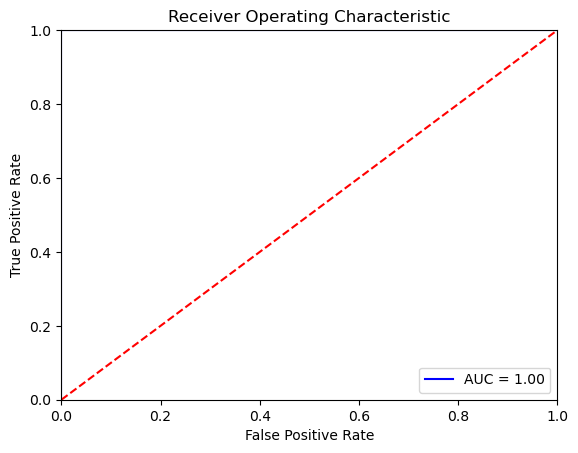

In [230]:
# ROC, AUC curve
fpr, tpr, threshold = metrics.roc_curve(y_res_train, prediction_res)
roc_auc = metrics.auc(fpr, tpr)

# method I: plt
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

### (b) Binary Classification Using L1-penalized logistic regression

#### i. Time Series Segments

In [116]:
#### Split time series
def l1_splitted_df(l, df): # l is the number split
    chunck_size = 480 // l

    chunks = [df.iloc[i : i + chunck_size] for i in range(0, len(df), chunck_size)]

    # Create a column called Part to indicate which part it is from the original data set
    for i, chunk in enumerate(chunks):
        chunk["Part"] = i % l
        if i%l == 0:
            chunk["Part"] = l

    #### Get the 3 time-domain feature from the splitted data sets: min, mean, max
    chunk_all = [chunk.groupby(["Instance", "Part"]).agg(["min", "mean", "max"]) for chunk in chunks]
    chunk_all = pd.concat(chunk_all)

    # To get a wider dataframe for regression
    chunk_all = chunk_all.pivot_table(index='Instance', columns='Part', values=["avg_rss12", "var_rss12", "avg_rss13", "var_rss13", "avg_rss23", "var_rss23"], aggfunc='first')
    chunk_all.columns = [f'{col[0]}_{col[1]}_{col[2]}_{i}' for i, col in enumerate(chunk_all.columns)] # Column name: time series_min/mean/max_part_column number
    chunk_all["Label"] = np.where(chunk_all.reset_index()["Instance"] <= 9, 1, 0) # Create a label column
    
    return chunk_all

In [118]:
l1_lp_score = dict()

for l in tqdm(range(1, 21)):
    train_df = l1_splitted_df(l, initial_train_df)

    X_train = train_df.loc[:, train_df.columns != "Label"]
    y_train = train_df.loc[:, "Label"]

    scaler = preprocessing.StandardScaler()
    X_train = scaler.fit_transform(X_train.to_numpy())

    # Feature selection
    selector = RFECV(estimator=LogisticRegression(), cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=45))

    # Fit the feature selector to your data
    selector.fit(X_train, y_train)

    # Transform the features to keep only the selected ones
    X_train_selected = selector.transform(X_train)

    # Fit the model by using parameter selected by CV
    model = LogisticRegression(penalty='l1', solver='liblinear')

    # Fit the model on the selected features
    model.fit(X_train_selected, y_train)

    # Predict using the selected features
    y_pred = model.predict(X_train_selected)

    # Evaluate the accuracy of the model using accuracy score
    cv_stratified = RepeatedStratifiedKFold(n_splits = 5, n_repeats=1, random_state= 45)
    score_l1 = accuracy_score(y_train, y_pred)

    l1_lp_score[f"{l}_score"] = score_l1

100%|██████████| 20/20 [02:47<00:00,  8.37s/it]


In [165]:
# The best value of the pair
l1_pairs_with_accuracy = pd.DataFrame(l1_lp_score).mean()
l1_best_pair = l1_pairs_with_accuracy[l1_pairs_with_accuracy == l1_pairs_with_accuracy.max()]

print(f"The best pair with accuracy score: {l1_best_pair[0]} ")

The best pair with accuracy score: 0.9857142857142858 


#### ii. Comparison

In the a iii quastion, I use RFECV to select the variables. The xxx performs better based on the accuracy score, but the L1 regulization is easier to implement for it caused less time. 

### (c) Multi-class Classification (The Realistic Case)

#### i. Time Series Segments

In [122]:
#### Split time series
def multi_splitted_df(l, df): # l is the number split
    chunck_size = 480 // l

    chunks = [df.iloc[i : i + chunck_size] for i in range(0, len(df), chunck_size)]

    # Create a column called Part to indicate which part it is from the original data set
    for i, chunk in enumerate(chunks):
        chunk["Part"] = i % l
        if i%l == 0:
            chunk["Part"] = l

    #### Get the 3 time-domain feature from the splitted data sets: min, mean, max
    chunk_all = [chunk.groupby(["Instance", "Part"]).agg(["min", "mean", "max"]) for chunk in chunks]
    chunk_all = pd.concat(chunk_all)

    # To get a wider dataframe for regression
    chunk_all = chunk_all.pivot_table(index='Instance', columns='Part', values=["avg_rss12", "var_rss12", "avg_rss13", "var_rss13", "avg_rss23", "var_rss23"], aggfunc='first')
    chunk_all.columns = [f'{col[0]}_{col[1]}_{col[2]}_{i}' for i, col in enumerate(chunk_all.columns)] # Column name: time series_min/mean/max_part_column number
    chunk_all["Label"] = np.where(chunk_all.reset_index()["Instance"] <= 9, 1, 0) # Create a label column
     
    chunk_all.loc[9:21, "Label"] = 2 # "Cycling"
    chunk_all.loc[21:33, "Label"] = 3 # "Lying"
    chunk_all.loc[33:45, "Label"] = 4 # "Sitting"
    chunk_all.loc[45:57, "Label"] = 5 # "Standing"
    chunk_all.loc[57:69, "Label"] = 6 # "Walking"
    

    return chunk_all

In [164]:
multi_l1_lp_score = dict()

for l in tqdm(range(1, 21)):
    train_df = multi_splitted_df(l, initial_train_df)

    X_train = train_df.loc[:, train_df.columns != "Label"]
    y_train = train_df.loc[:, "Label"]

    scaler = preprocessing.StandardScaler()
    X_train = scaler.fit_transform(X_train.to_numpy())

    # Feature selection
    selector = RFECV(estimator=LogisticRegression(), cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=45))

    # Fit the feature selector to your data
    selector.fit(X_train, y_train)

    # Transform the features to keep only the selected ones
    X_train_selected = selector.transform(X_train)

    # Instantiate Logistic model
    model = LogisticRegression(penalty='l1', solver="saga", multi_class= "multinomial")

    # Fit the model on the selected features
    model.fit(X_train_selected, y_train)

    # Predict using the selected features
    y_pred = model.predict(X_train_selected)
    
    # Fit the model by using parameter selected by CV

    multi_score = accuracy_score(y_train, y_pred)

    multi_l1_lp_score[f"{l}_score"] = multi_score

  0%|          | 0/20 [00:00<?, ?it/s]

100%|██████████| 20/20 [06:23<00:00, 19.16s/it]


In [ ]:
# The best value of the pair
multi_l1_pairs_with_accuracy = pd.DataFrame(multi_l1_lp_score).mean()
multi_l1_best_pair = multi_l1_pairs_with_accuracy[multi_l1_pairs_with_accuracy == multi_l1_pairs_with_accuracy.max()]

print(f"The best pair {multi_l1_best_pair.index.values} with accuracy score: {multi_l1_best_pair[0]} ")

#### ii. Naive Bayes

In [160]:
Gau_l_score = dict()

for l in tqdm(range(1, 21)):
    train_df = multi_splitted_df(l, initial_train_df)

    X_train = train_df.loc[:, train_df.columns != "Label"]
    y_train = train_df.loc[:, "Label"]

    # Define the feature selection model (DecisionTreeClassifier in this example)
    selector = RFECV(estimator=LogisticRegression(), cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=45))

    # Fit the feature selector to your data
    selector.fit(X_train, y_train)

    # Transform the features to keep only the selected ones
    X_train_selected = selector.transform(X_train)

    # Instantiate Gaussian Naive Bayes model
    model = GaussianNB()

    # Fit the model on the selected features
    model.fit(X_train_selected, y_train)

    # Predict using the selected features
    y_pred = model.predict(X_train_selected)

    accuracy_Gau = accuracy_score(y_train, y_pred)

    Gau_l_score[f"{l}_score"] = accuracy_Gau

  0%|          | 0/20 [00:00<?, ?it/s]

100%|██████████| 20/20 [09:20<00:00, 28.05s/it]


In [162]:
# The best value of the pair
Gau_pairs_with_accuracy = pd.DataFrame(list(Gau_l_score.items()), columns=['Pair', 'Accuracy'])
Gau_score = Gau_pairs_with_accuracy["Accuracy"].max()
Gau_error = 1- Gau_score
Gau_error

0.01449275362318836

In [145]:
MulNB_l_score = dict()

for l in tqdm(range(1, 21)):
    train_df = multi_splitted_df(l, initial_train_df)

    X_train = train_df.loc[:, train_df.columns != "Label"]
    y_train = train_df.loc[:, "Label"]

    # Define the feature selection model (DecisionTreeClassifier in this example)
    selector = RFECV(estimator=LogisticRegression(), cv=RepeatedStratifiedKFold(n_splits=5, n_repeats=1, random_state=45))

    # Fit the feature selector to your data
    selector.fit(X_train, y_train)

    # Transform the features to keep only the selected ones
    X_train_selected = selector.transform(X_train)

    # Instantiate Gaussian Naive Bayes model
    model = MultinomialNB()

    # Fit the model on the selected features
    model.fit(X_train_selected, y_train)

    # Predict using the selected features
    y_pred = model.predict(X_train_selected)

    accuracy_MulNB = accuracy_score(y_train, y_pred)

    MulNB_l_score[f"{l}_score"] = accuracy_MulNB

100%|██████████| 20/20 [08:24<00:00, 25.21s/it]


In [163]:
# The best value of the pair
MulNB_pairs_with_accuracy = pd.DataFrame(list(MulNB_l_score.items()), columns=['Pair', 'Accuracy'])
MulNB_best = MulNB_pairs_with_accuracy["Accuracy"].max()
MulNB_test_error = 1- MulNB_best
MulNB_test_error

0.07246376811594202

#### iii. Comparison

Based on the accuracy, the logistic regression perform the best. 

## 3. ISLR 4.8.3

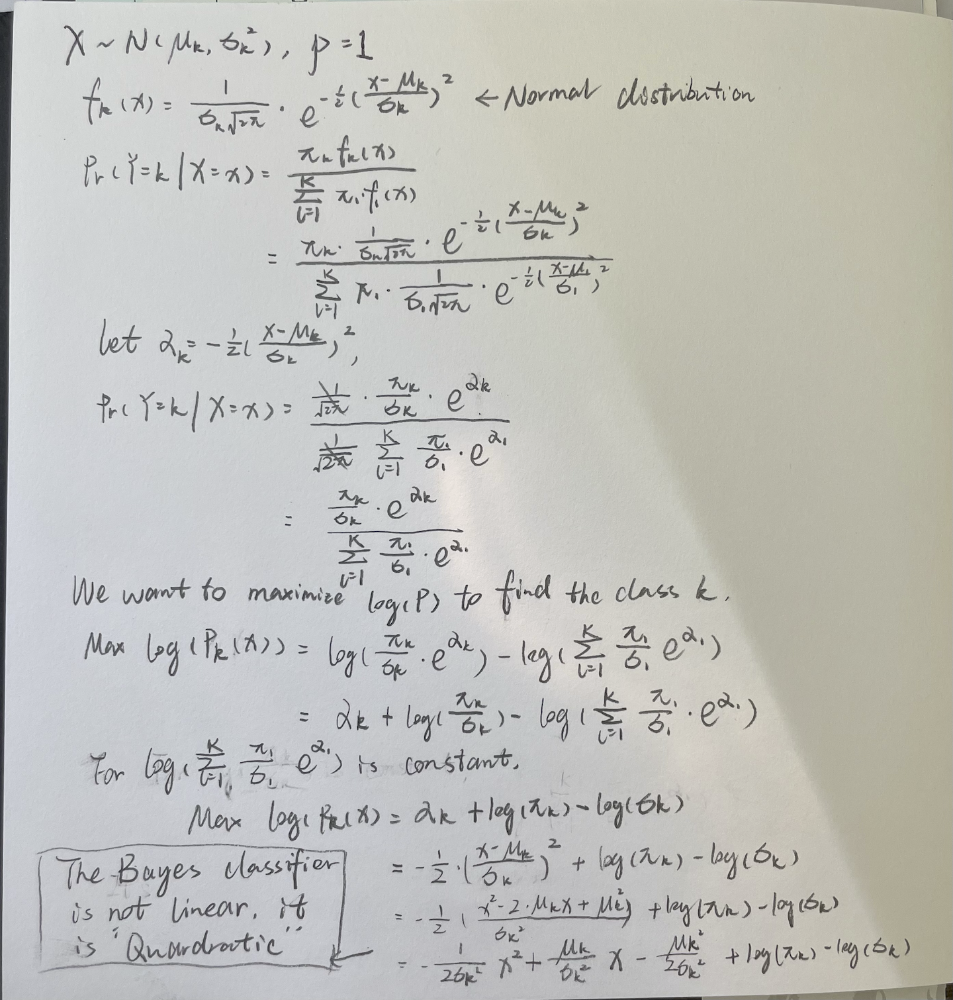

In [232]:
Image('./4.8.3.png')

## 4. ISLR 4.8.7

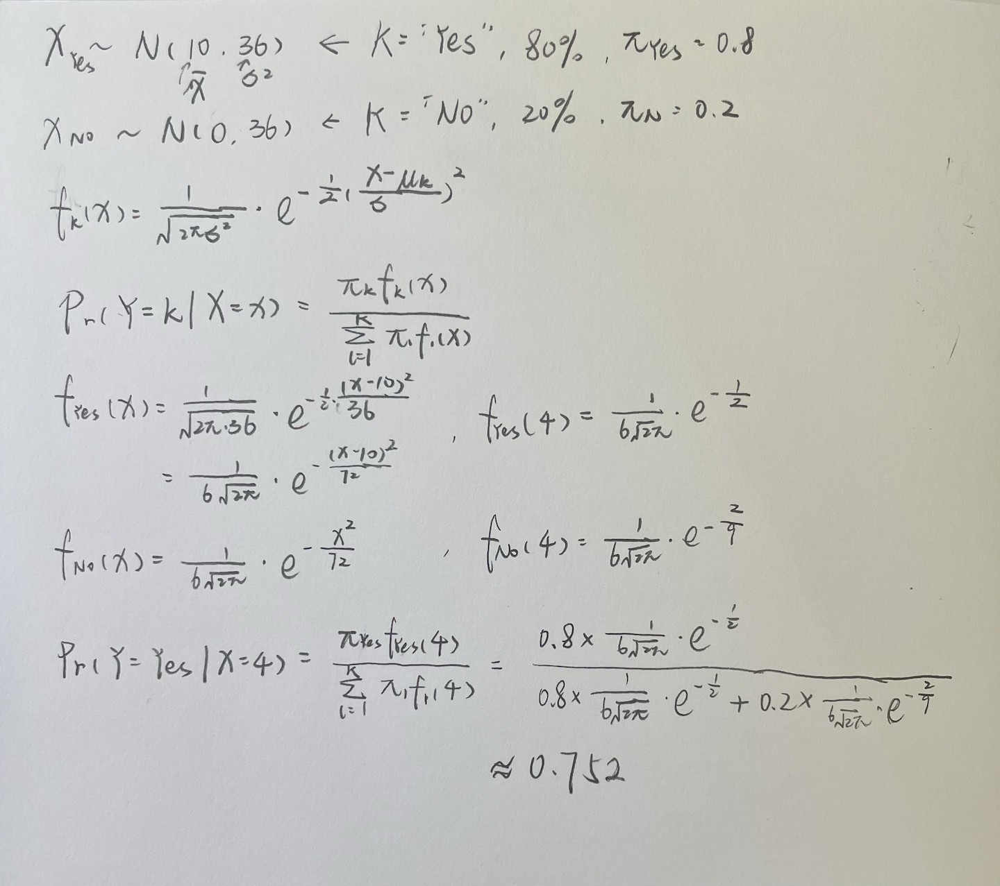

In [231]:
Image("./4.8.7.png")

## 5.1. Extra Practice ISLR 4.8.4

## 5.2. Extra Practice ISLR 4.8.9